In [67]:
from IPython.core.display import HTML
display(HTML("""
<script>
code_show=true;
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
}
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()">
<input type="submit" value="Click here to toggle on/off the raw code.">
</form>"""))

<img src='ml3_banner.png'>

# <center> Drawing with ML using Variational AutoEncoder </center>

In [56]:
import numpy as np
import tensorflow as tf
import keras
from tensorflow.keras import layers
from keras import backend as K
from tensorflow.keras.models import Model
from keras.preprocessing.image import img_to_array, load_img, array_to_img
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm 
import os
import re

import warnings
warnings.filterwarnings("ignore")


def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)

def plot_images(image, sketches):
    plt.figure(figsize=(7,7))
    plt.subplot(1,2,1)
    plt.title('Image', color='black', fontsize=20)
    plt.imshow(image)
    plt.subplot(1,2,2)
    plt.title('Sketches', color='black', fontsize=20)
    plt.imshow(sketches)
    plt.show()
    
def image_reshape(image, size):
    return np.reshape(image, (len(image), size, size, 3))

def sample_z(args):
    z_mean, z_sigma = args
    epsilon = K.random_normal(shape=K.shape(z_mean), mean=0., stddev=1.)
    return z_mean + K.exp(z_sigma / 2) * epsilon

def show_images(real, predicted):
    plt.figure(figsize = (12,12))
    plt.subplot(1,2,1)
    plt.title("Image",fontsize = 15, color = 'Lime')
    plt.imshow(real)
    plt.subplot(1,2,2)
    plt.title("Predicted",fontsize = 15, color = 'gold')
    plt.imshow(predicted)
    
def image_augmentation(image_file, image_path):
    augmented_array = []
    for i in tqdm(image_file):
        image = cv2.imread(image_path + '/' + i, 1)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # convert to rgb
        image = cv2.resize(image, (size, size)) # resize image
        image = image.astype('float32') / 255.0 # normalize
        augmented_array.append(img_to_array(image))

        # image augmentation part
        img1 = cv2.flip(image, 1) # horizontal flip
        img2 = cv2.flip(image, -1) # vertical flip
        img3 = cv2.flip(img2, 1) # vertical-horizontal flip
        img4 = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE) # rotate clockwise
        img5 = cv2.flip(img4, 1) # flip rotated image
        img6 = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE) # rotate
        img7 = cv2.flip(img6, 1) # flip rotated image

        for img in [img1, img2, img3, img4, img5, img6, img7]:
            augmented_array.append(img_to_array(img))

    return augmented_array

## Highlights of the Project
* Using Variational AutoEncoder in generating sketch image from an image.
* Application of Variational AutoEncoder in Keras (building the model from scratch)
* Using Data/Image Augmentation technique in increasing the number of the train dataset.
* Difference of the generator from 25, 50, 250, and 1000 epoch.
* Using Variational AutoEncoder in generating image from sketch images. (shown in the appendix)


## Introduction of Variational AutoEncoder

Variational AutoEncoder is an autoencoder whose training is regularised to avoid overfitting and ensure that the latent space has good properties that enable generative process. It maps the input data into the parameters of a probability distribution, such as the mean and variance of a Gaussian which is shown in the center of Figure 1. The latent vector is then sampled from this mean and variance which is then fed to the decoder to reconstruct the input. Table 1 shows the difference between AutoEncoder and Variational AutoEncoder.

<br>
<center><b>Figure 1.</b>Variational AutoEncoder Architecture</center>
<img src='VAE.PNG'>
<br>

<center><b>Table 1.</b> AutoEncoder vs Variational AutoEncoder</center>

|<center>Item</center>|<center>AutoEncoder</center>|<center>VAE</center>|
|:|:|:|
|<center>latent space</center>|compressed transformation of an input|compressed form is mean and variance|
|<center>regularized latent space</center>|no|yes|
|<center>latent variable</center>|with discontinuity|smooth and continuous|
|<center>picking a random variable</center>|generates garbage output|generates meaningful output|
|<center>generative capability</center>|lacking|has generative capability|

## Applying Variational AutoEncoder

### Loading the Data

The CUHK Face Sketch Database is downloaded from Kaggle. Only the 188 images from CUHK student database would be used for this project.

188it [00:00, 515.59it/s]


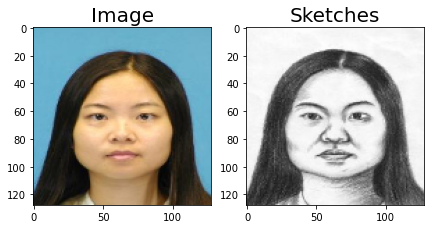

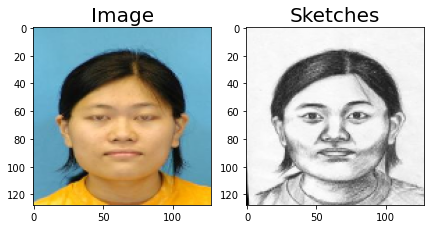

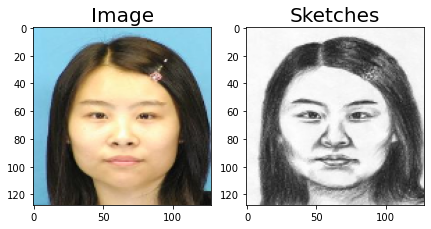

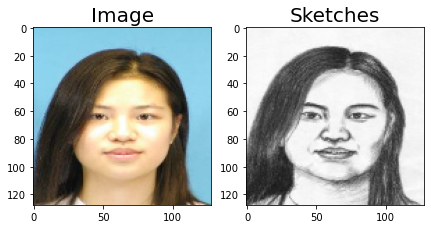

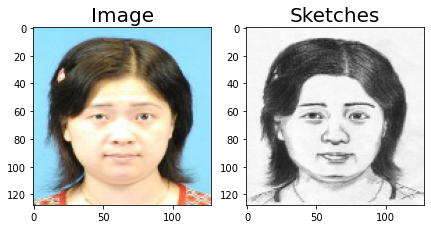

In [48]:
image_file = sorted_alphanumeric(os.listdir('Data/photos'))
sketch_file = sorted_alphanumeric(os.listdir('Data/sketches'))

# defining the size of image 
size = 128

img_array = []
sketch_array = []
for i, j in tqdm(zip(image_file, sketch_file)):
    # image
    image = cv2.imread('Data/photos' + '/' + i, 1)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (size, size))
    image = image.astype('float32') / 255.0
    img_array.append(img_to_array(image))
    # sketch
    sketch = cv2.imread('Data/sketches' + '/' + j, 1)
    sketch = cv2.cvtColor(sketch, cv2.COLOR_BGR2RGB)
    sketch = cv2.resize(sketch, (size, size))
    sketch = sketch.astype('float32') / 255.0
    sketch_array.append(img_to_array(sketch))
    
for i in range(5):
    plot_images(img_array[i], sketch_array[i])

### Data Augmentation

In [54]:
image_aug = image_augmentation(image_file, 'Data/photos')
sketch_aug = image_augmentation(sketch_file,'Data/sketches')

100%|██████████| 188/188 [00:00<00:00, 474.13it/s]


### Train, Validation, and Test Split

In [55]:
# Split to Train, Val, and Test
train_sketch_image = sketch_aug[:1050]
train_image = image_aug[:1050]
val_sketch_image = sketch_aug[1050:1400]
val_image = image_aug[1050:1400]
test_sketch_image = sketch_aug[1400:]
test_image = image_aug[1400:]

# Reshaping of Images
train_sketch_image = image_reshape(train_sketch_image, size)
train_image = image_reshape(train_image, size)
val_sketch_image = image_reshape(val_sketch_image, size)
val_image = image_reshape(val_image, size)
test_sketch_image = image_reshape(test_sketch_image, size)
test_image = image_reshape(test_image, size)

# Print
print('Train shape:', train_image.shape)
print('Val shape:', val_image.shape)
print('Test shape', test_image.shape)

Train shape: (1050, 128, 128, 3)
Val shape: (350, 128, 128, 3)
Test shape (104, 128, 128, 3)


### Variational AutoEncoder Architecture

In [59]:
input_layer = layers.Input(shape=(size, size, 3))

# Encoder
x = layers.Conv2D(32, 4, activation="relu", padding="same")(input_layer)
x = layers.Conv2D(64, 4, activation="relu", padding="same")(x)
x = layers.MaxPooling2D(2, padding="same")(x)
x = layers.Conv2D(128, 3, activation="relu", padding="same")(x)
x = layers.Conv2D(128, 3, activation="relu", padding="same")(x)
x = layers.Conv2D(256, 3, activation="relu", padding="same")(x)
x = layers.Conv2D(256, 3, activation="relu", padding="same")(x)
x = layers.MaxPooling2D(2, padding="same")(x)

# Center
z_mean = Dense(2, name='z_mean')(x)
z_sigma = Dense(2, name='z_sigma')(x)
z = Lambda(sample_z, name='z_sampled')([z_mean, z_sigma])
t = Dense(16, activation='tanh', name='decoder_hidden')(z)
decoded_mean = Dense(16, activation=None, name='decoded_mean')(t)

# Decoder
x = layers.Conv2DTranspose(16, 3, strides=2, activation="relu", padding="same")(decoded_mean)
x = layers.Conv2DTranspose(8, 3, strides=2, activation="relu", padding="same")(x)
x = layers.Conv2D(3, 3, activation="sigmoid", padding="same")(x)

# VAE
vae = Model(input_layer, x)
vae.compile(optimizer='adamax',
            loss="mean_absolute_error", metrics=['acc'])
vae.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv2d_7 (Conv2D)               (None, 128, 128, 32) 1568        input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_8 (Conv2D)               (None, 128, 128, 64) 32832       conv2d_7[0][0]                   
__________________________________________________________________________________________________
max_pooling2d_2 (MaxPooling2D)  (None, 64, 64, 64)   0           conv2d_8[0][0]                   
____________________________________________________________________________________________

### Image to Sketch Generator

### @25 Epoch

In [11]:
history_25 = vae.fit(
            x=train_image,
            y=train_sketch_image,
            epochs=25,
            validation_data=(val_image, val_sketch_image),
            batch_size=25)

2022-03-07 22:39:02.527093: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/25


2022-03-07 22:39:04.415278: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8101
2022-03-07 22:39:05.111546: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-03-07 22:39:05.112457: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-03-07 22:39:05.112488: W tensorflow/stream_executor/gpu/asm_compiler.cc:77] Couldn't get ptxas version string: Internal: Couldn't invoke ptxas --version
2022-03-07 22:39:05.113399: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-03-07 22:39:05.113577: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.


42/42 [==============================] - 9s 75ms/step - loss: 0.3639 - acc: 0.4704 - val_loss: 0.3189 - val_acc: 0.4900
Epoch 2/25
42/42 [==============================] - 3s 63ms/step - loss: 0.2291 - acc: 0.4454 - val_loss: 0.1503 - val_acc: 0.3823
Epoch 3/25
42/42 [==============================] - 3s 64ms/step - loss: 0.1367 - acc: 0.3800 - val_loss: 0.1136 - val_acc: 0.3591
Epoch 4/25
42/42 [==============================] - 3s 63ms/step - loss: 0.1077 - acc: 0.3342 - val_loss: 0.0964 - val_acc: 0.3560
Epoch 5/25
42/42 [==============================] - 3s 63ms/step - loss: 0.0900 - acc: 0.3431 - val_loss: 0.0904 - val_acc: 0.3464
Epoch 6/25
42/42 [==============================] - 3s 63ms/step - loss: 0.0830 - acc: 0.3532 - val_loss: 0.0913 - val_acc: 0.3660
Epoch 7/25
42/42 [==============================] - 3s 63ms/step - loss: 0.0817 - acc: 0.3657 - val_loss: 0.0842 - val_acc: 0.3666
Epoch 8/25
42/42 [==============================] - 3s 67ms/step - loss: 0.0799 - acc: 0.3641 

In [12]:
# Test Evaluation
prediction_25 = vae.evaluate(test_image, test_sketch_image)

4/4 [==============================] - 3s 272ms/step - loss: 0.0766 - acc: 0.3590


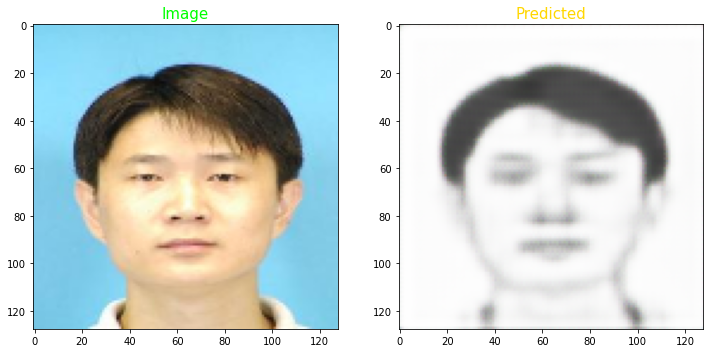

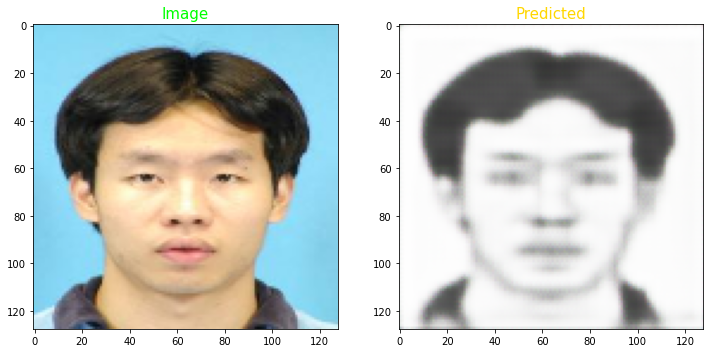

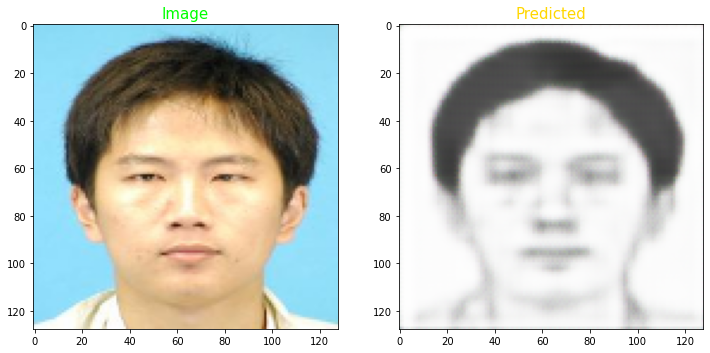

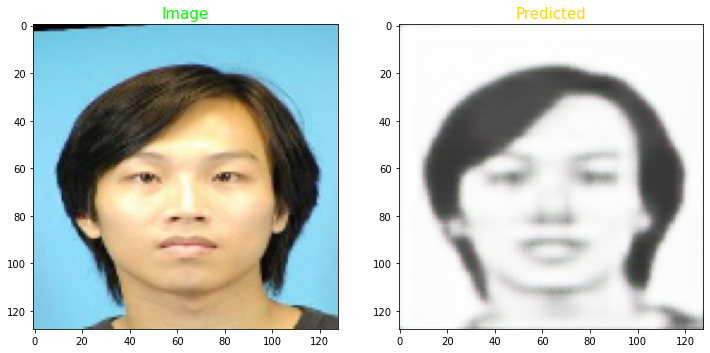

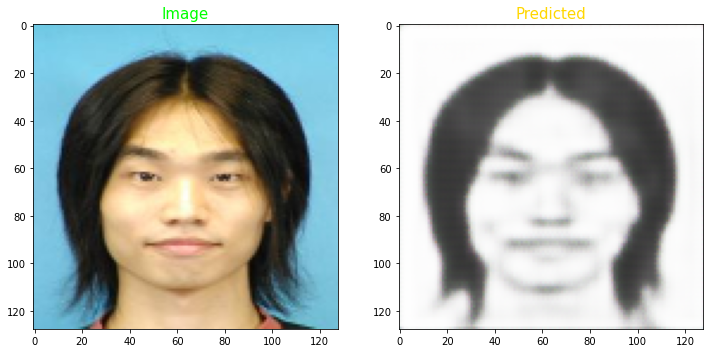

...

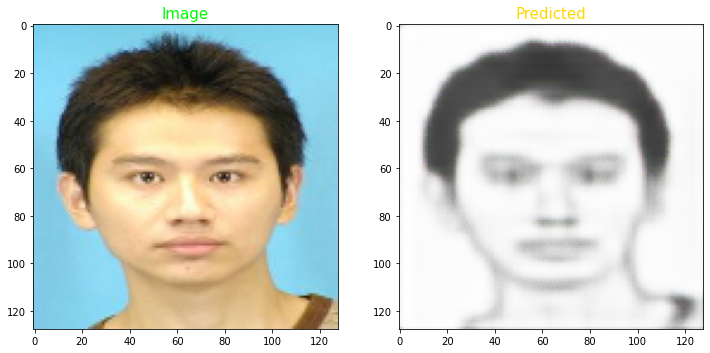

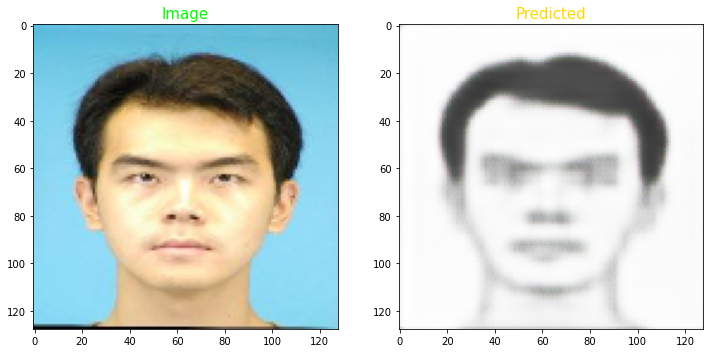

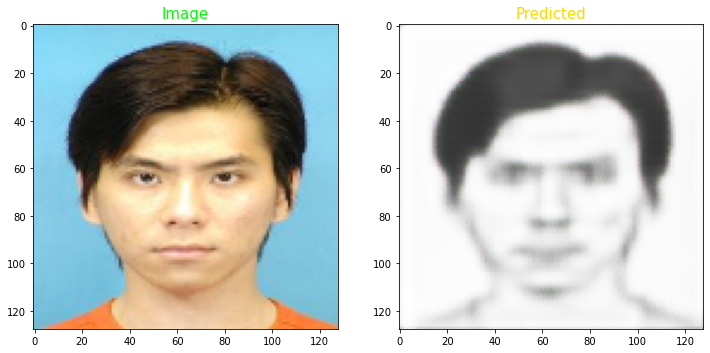

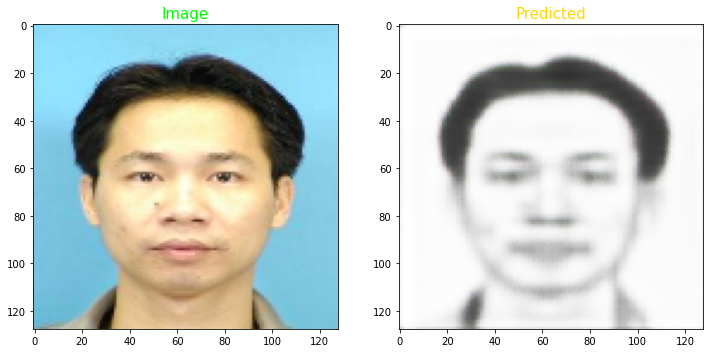

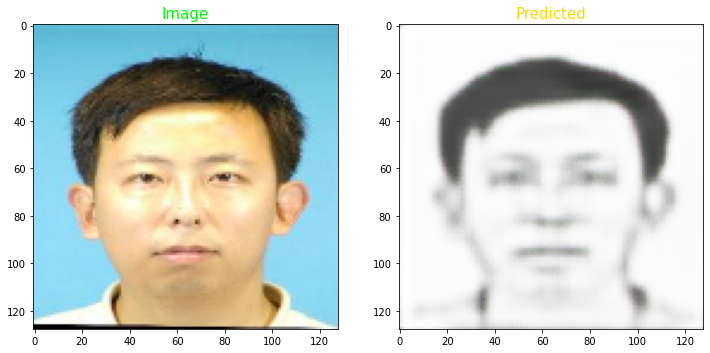

In [14]:
num = [i for i in range(0, 95, 8)]
for i in num:
    predicted = (np.clip(vae.predict(
        test_image[i].reshape(1, size, size, 3)), 0.0, 1.0)
                     .reshape(size, size, 3))
    show_images(test_image[i], predicted)

At 25 epoch, the results shows that the predicted sketch image is blurry but we can see the model got the outline of head, hair, and face of the picture correctly.

### @50 Epoch

In [15]:
history_50 = vae.fit(
            x=train_image,
            y=train_sketch_image,
            epochs=50,
            validation_data=(val_image, val_sketch_image),
            batch_size=25)

Epoch 1/50
42/42 [==============================] - 4s 76ms/step - loss: 0.0747 - acc: 0.3562 - val_loss: 0.0812 - val_acc: 0.3477
Epoch 2/50
42/42 [==============================] - 3s 64ms/step - loss: 0.0742 - acc: 0.3513 - val_loss: 0.0798 - val_acc: 0.3630
Epoch 3/50
42/42 [==============================] - 3s 65ms/step - loss: 0.0744 - acc: 0.3566 - val_loss: 0.0802 - val_acc: 0.3518
Epoch 4/50
42/42 [==============================] - 3s 72ms/step - loss: 0.0743 - acc: 0.3444 - val_loss: 0.0792 - val_acc: 0.3653
Epoch 5/50
42/42 [==============================] - 3s 63ms/step - loss: 0.0744 - acc: 0.3566 - val_loss: 0.0802 - val_acc: 0.3537
Epoch 6/50
42/42 [==============================] - 3s 66ms/step - loss: 0.0742 - acc: 0.3480 - val_loss: 0.0808 - val_acc: 0.3510
Epoch 7/50
42/42 [==============================] - 3s 64ms/step - loss: 0.0734 - acc: 0.3517 - val_loss: 0.0794 - val_acc: 0.3545
Epoch 8/50
42/42 [==============================] - 3s 64ms/step - loss: 0.0733 - a

In [16]:
# Test Evaluation
prediction_50 = vae.evaluate(test_image, test_sketch_image)

4/4 [==============================] - 0s 27ms/step - loss: 0.0726 - acc: 0.3253


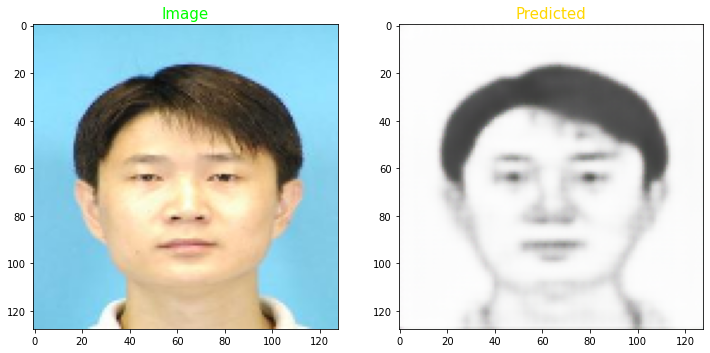

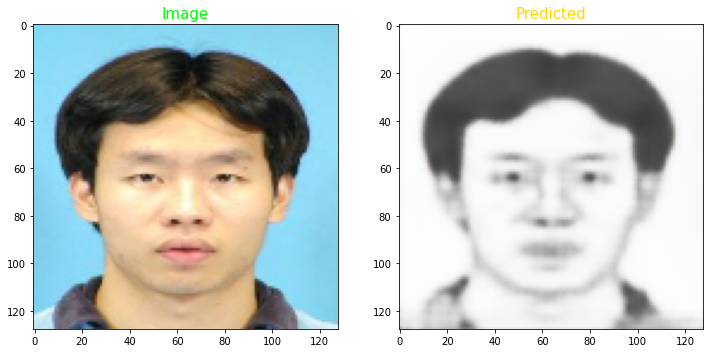

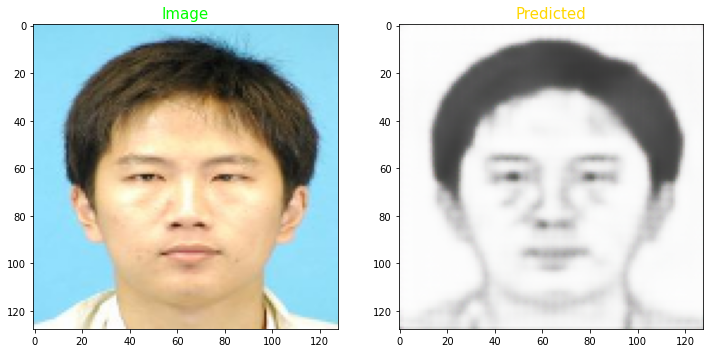

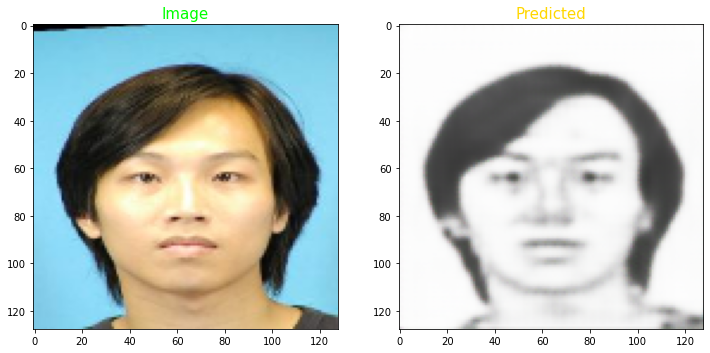

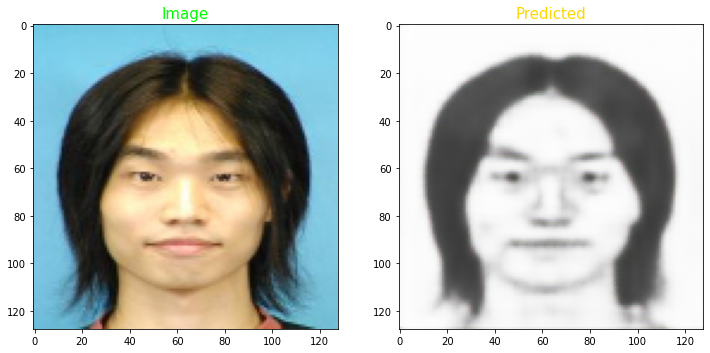

...

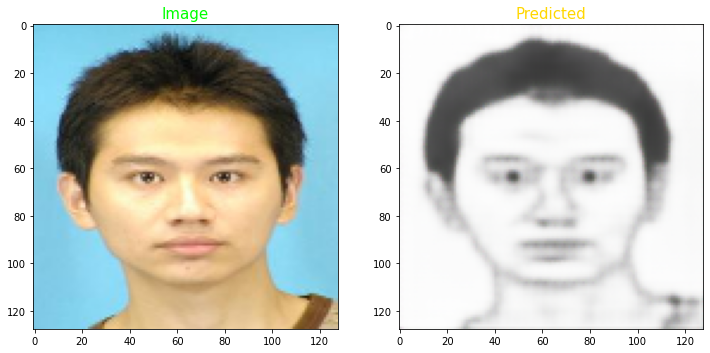

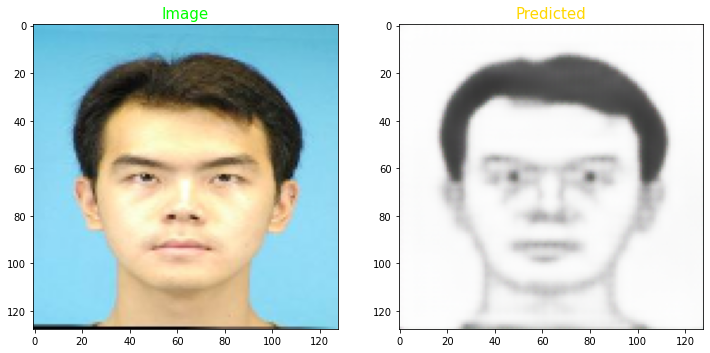

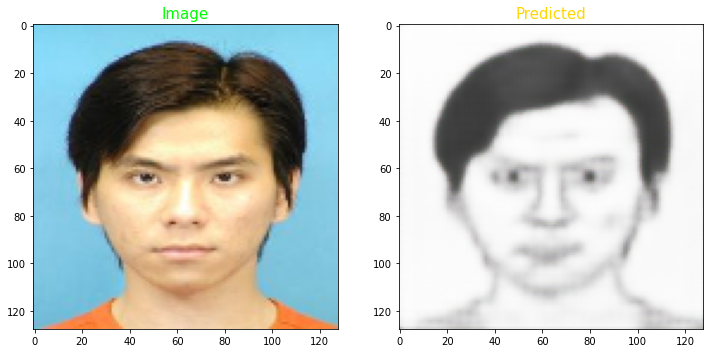

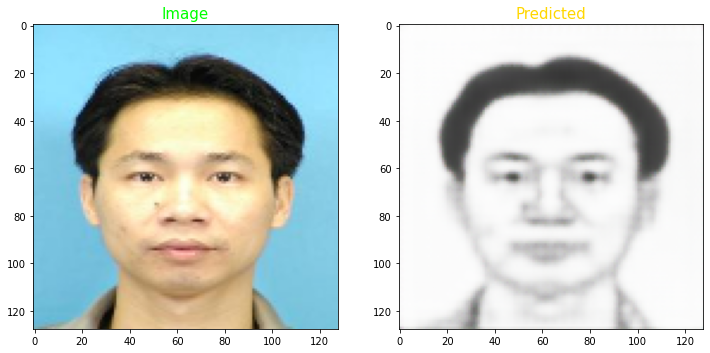

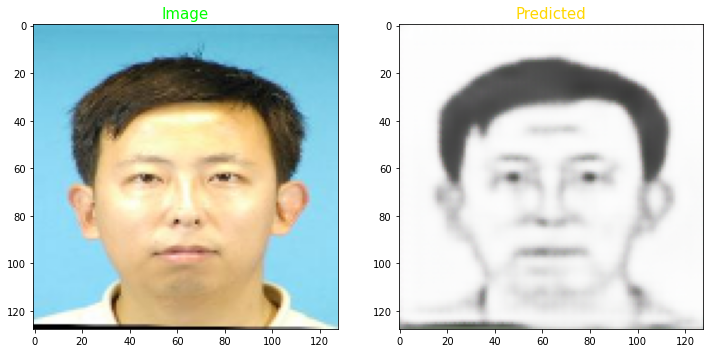

In [17]:
num = [i for i in range(0, 95, 8)]
for i in num:
    predicted = (np.clip(vae.predict(
        test_image[i].reshape(1, size, size, 3)), 0.0, 1.0)
                     .reshape(size, size, 3))
    show_images(test_image[i], predicted)

At 50 epoch, we can already clearly see the features of the head, hair, and face of the sketch more clearly compared to the results at 25 epoch. But the drawing is still a bit blurry.

### @250 Epoch

In [18]:
history_250 = vae.fit(
            x=train_image,
            y=train_sketch_image,
            epochs=250,
            validation_data=(val_image, val_sketch_image),
            batch_size=25)

Epoch 1/250
42/42 [==============================] - 3s 71ms/step - loss: 0.0681 - acc: 0.3264 - val_loss: 0.0766 - val_acc: 0.3296
Epoch 2/250
42/42 [==============================] - 3s 63ms/step - loss: 0.0682 - acc: 0.3223 - val_loss: 0.0775 - val_acc: 0.3286
Epoch 3/250
42/42 [==============================] - 3s 65ms/step - loss: 0.0686 - acc: 0.3270 - val_loss: 0.0766 - val_acc: 0.3322
Epoch 4/250
42/42 [==============================] - 3s 64ms/step - loss: 0.0679 - acc: 0.3223 - val_loss: 0.0793 - val_acc: 0.3163
Epoch 5/250
42/42 [==============================] - 3s 79ms/step - loss: 0.0680 - acc: 0.3270 - val_loss: 0.0785 - val_acc: 0.3262
Epoch 6/250
42/42 [==============================] - 3s 71ms/step - loss: 0.0683 - acc: 0.3192 - val_loss: 0.0771 - val_acc: 0.3264
Epoch 7/250
42/42 [==============================] - 3s 69ms/step - loss: 0.0674 - acc: 0.3273 - val_loss: 0.0781 - val_acc: 0.3270
Epoch 8/250
42/42 [==============================] - 3s 64ms/step - loss: 0.

42/42 [==============================] - 3s 67ms/step - loss: 0.0569 - acc: 0.3549 - val_loss: 0.0769 - val_acc: 0.3651
Epoch 124/250
42/42 [==============================] - 3s 64ms/step - loss: 0.0564 - acc: 0.3687 - val_loss: 0.0782 - val_acc: 0.3668
Epoch 125/250
42/42 [==============================] - 3s 64ms/step - loss: 0.0563 - acc: 0.3554 - val_loss: 0.0776 - val_acc: 0.3621
Epoch 126/250
42/42 [==============================] - 3s 67ms/step - loss: 0.0561 - acc: 0.3715 - val_loss: 0.0794 - val_acc: 0.3613
Epoch 127/250
42/42 [==============================] - 3s 67ms/step - loss: 0.0561 - acc: 0.3644 - val_loss: 0.0780 - val_acc: 0.3605
Epoch 128/250
42/42 [==============================] - 3s 63ms/step - loss: 0.0565 - acc: 0.3514 - val_loss: 0.0790 - val_acc: 0.3730
Epoch 129/250
42/42 [==============================] - 3s 64ms/step - loss: 0.0568 - acc: 0.3734 - val_loss: 0.0774 - val_acc: 0.3659
Epoch 130/250
42/42 [==============================] - 3s 63ms/step - loss: 

42/42 [==============================] - 3s 63ms/step - loss: 0.0483 - acc: 0.3984 - val_loss: 0.0802 - val_acc: 0.3858
Epoch 246/250
42/42 [==============================] - 3s 63ms/step - loss: 0.0483 - acc: 0.3902 - val_loss: 0.0790 - val_acc: 0.3970
Epoch 247/250
42/42 [==============================] - 3s 63ms/step - loss: 0.0486 - acc: 0.3906 - val_loss: 0.0807 - val_acc: 0.3934
Epoch 248/250
42/42 [==============================] - 3s 63ms/step - loss: 0.0485 - acc: 0.3820 - val_loss: 0.0810 - val_acc: 0.3991
Epoch 249/250
42/42 [==============================] - 3s 63ms/step - loss: 0.0485 - acc: 0.3981 - val_loss: 0.0787 - val_acc: 0.3999
Epoch 250/250
42/42 [==============================] - 3s 64ms/step - loss: 0.0481 - acc: 0.3941 - val_loss: 0.0812 - val_acc: 0.3871


In [19]:
# Test Evaluation
prediction_250 = vae.evaluate(test_image, test_sketch_image)

4/4 [==============================] - 0s 33ms/step - loss: 0.0762 - acc: 0.3836


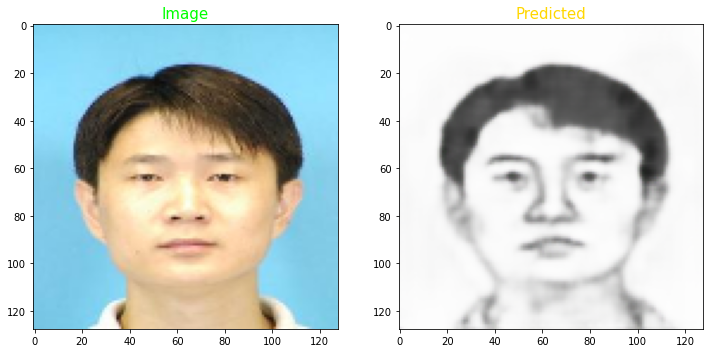

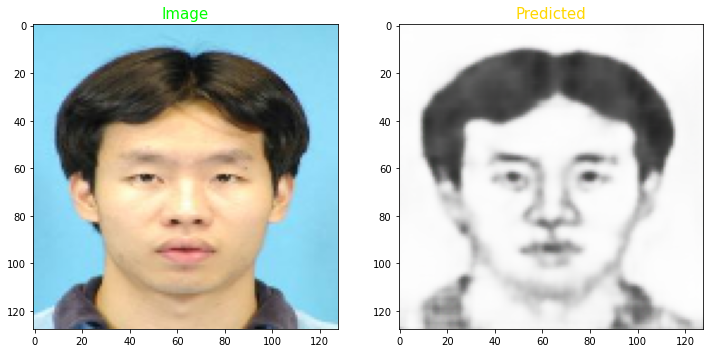

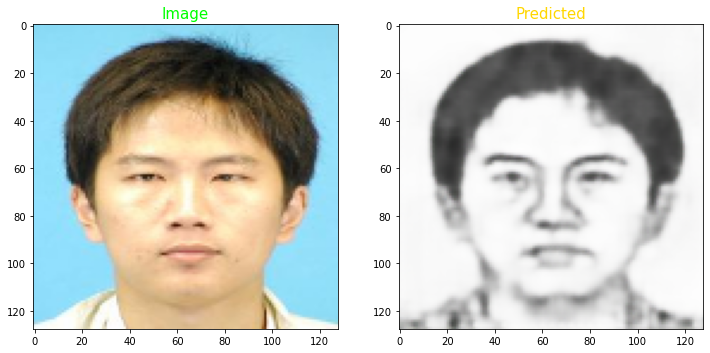

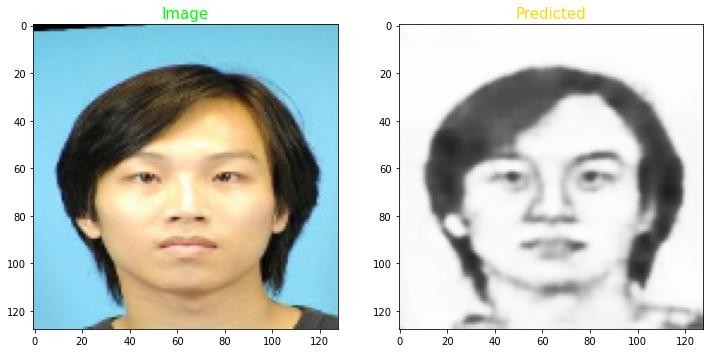

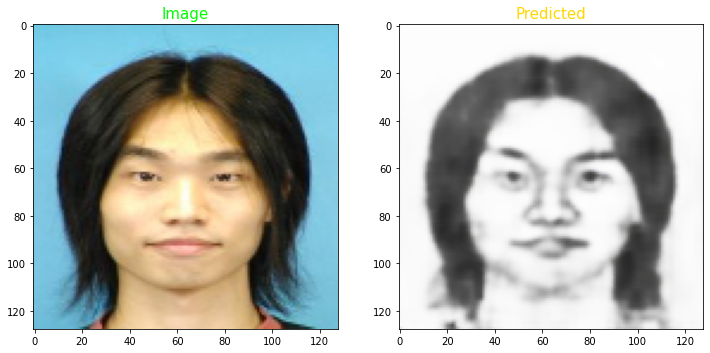

...

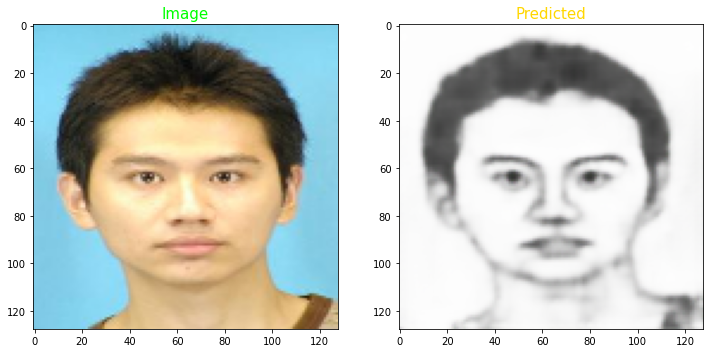

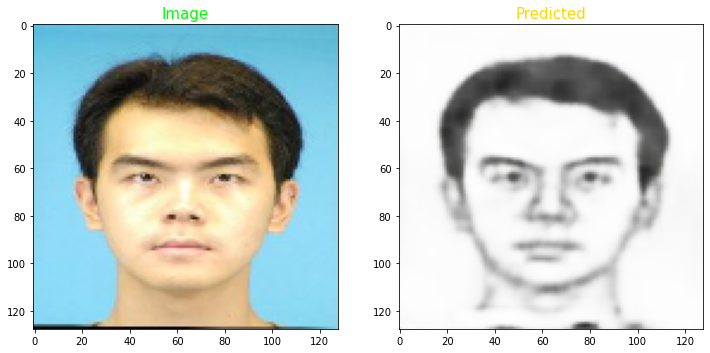

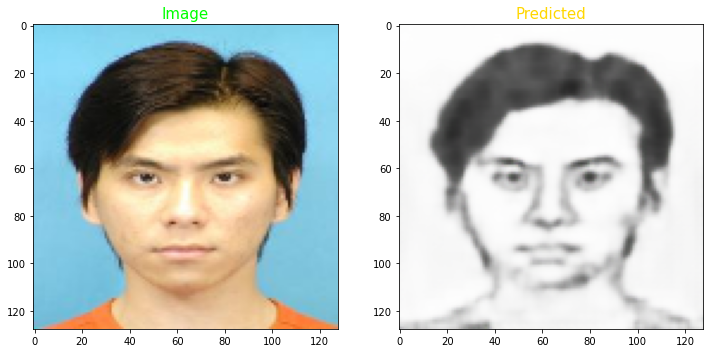

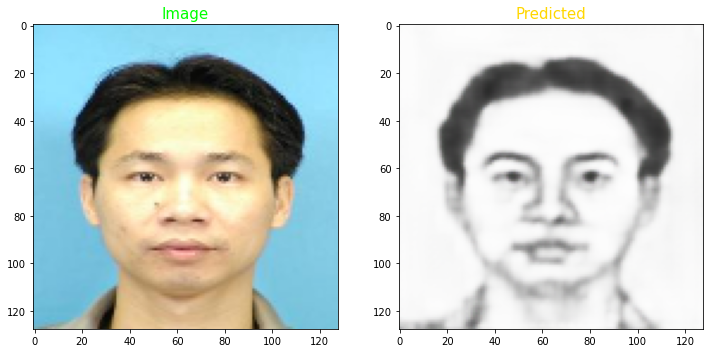

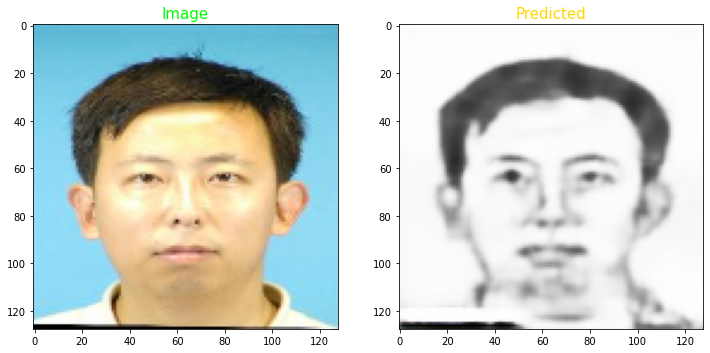

In [20]:
num = [i for i in range(0, 95, 8)]
for i in num:
    predicted = (np.clip(vae.predict(
        test_image[i].reshape(1, size, size, 3)), 0.0, 1.0)
                     .reshape(size, size, 3))
    show_images(test_image[i], predicted)

At 250 epoch, we can see a more detailed outline already of the head, hair, and face compared to the previous results. But it is still a bit blurry.

### @1000 Epoch

In [21]:
history_1000 = vae.fit(
            x=train_image,
            y=train_sketch_image,
            epochs=1000,
            validation_data=(val_image, val_sketch_image),
            batch_size=25)

Epoch 1/1000
42/42 [==============================] - 3s 71ms/step - loss: 0.0485 - acc: 0.3938 - val_loss: 0.0818 - val_acc: 0.3863
Epoch 2/1000
42/42 [==============================] - 3s 67ms/step - loss: 0.0481 - acc: 0.3902 - val_loss: 0.0799 - val_acc: 0.3934
Epoch 3/1000
42/42 [==============================] - 3s 66ms/step - loss: 0.0477 - acc: 0.3856 - val_loss: 0.0791 - val_acc: 0.3934
Epoch 4/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0478 - acc: 0.3906 - val_loss: 0.0794 - val_acc: 0.3919
Epoch 5/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0478 - acc: 0.3910 - val_loss: 0.0801 - val_acc: 0.3904
Epoch 6/1000
42/42 [==============================] - 3s 66ms/step - loss: 0.0467 - acc: 0.3871 - val_loss: 0.0793 - val_acc: 0.3966
Epoch 52/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0462 - acc: 0.3854 - val_loss: 0.0809 - val_acc: 0.3942
Epoch 53/1000
42/42 [==============================] - 3s 63ms/step 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



42/42 [==============================] - 3s 64ms/step - loss: 0.0438 - acc: 0.4070 - val_loss: 0.0808 - val_acc: 0.4101
Epoch 145/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0438 - acc: 0.4023 - val_loss: 0.0809 - val_acc: 0.4114
Epoch 146/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0441 - acc: 0.4070 - val_loss: 0.0826 - val_acc: 0.4209
Epoch 147/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0439 - acc: 0.4218 - val_loss: 0.0825 - val_acc: 0.3889
Epoch 148/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0441 - acc: 0.4020 - val_loss: 0.0818 - val_acc: 0.4148
Epoch 149/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0445 - acc: 0.4097 - val_loss: 0.0834 - val_acc: 0.4164
Epoch 150/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0440 - acc: 0.4138 - val_loss: 0.0817 - val_acc: 0.3982
Epoch 151/1000
42/42 [==============================] - 3s 63ms/step -

Epoch 205/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0435 - acc: 0.4207 - val_loss: 0.0819 - val_acc: 0.4234
Epoch 206/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0439 - acc: 0.4228 - val_loss: 0.0816 - val_acc: 0.4211
Epoch 207/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0434 - acc: 0.4246 - val_loss: 0.0818 - val_acc: 0.4188
Epoch 208/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0437 - acc: 0.4172 - val_loss: 0.0830 - val_acc: 0.4273
Epoch 209/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0436 - acc: 0.4175 - val_loss: 0.0802 - val_acc: 0.4152
Epoch 210/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0433 - acc: 0.4293 - val_loss: 0.0816 - val_acc: 0.4131
Epoch 211/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0434 - acc: 0.4151 - val_loss: 0.0807 - val_acc: 0.4316
Epoch 212/1000
42/42 [==============================] -

Epoch 266/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0423 - acc: 0.4330 - val_loss: 0.0828 - val_acc: 0.4253
Epoch 267/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0434 - acc: 0.4249 - val_loss: 0.0833 - val_acc: 0.4418
Epoch 268/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0425 - acc: 0.4484 - val_loss: 0.0839 - val_acc: 0.4232
Epoch 269/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0426 - acc: 0.4235 - val_loss: 0.0814 - val_acc: 0.4306
Epoch 270/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0426 - acc: 0.4366 - val_loss: 0.0800 - val_acc: 0.4314
Epoch 271/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0427 - acc: 0.4374 - val_loss: 0.0821 - val_acc: 0.4179
Epoch 272/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0417 - acc: 0.4411 - val_loss: 0.0836 - val_acc: 0.4225
Epoch 273/1000
42/42 [==============================] -

Epoch 327/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0417 - acc: 0.4445 - val_loss: 0.0845 - val_acc: 0.4356
Epoch 328/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0419 - acc: 0.4346 - val_loss: 0.0830 - val_acc: 0.4475
Epoch 329/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0431 - acc: 0.4446 - val_loss: 0.0816 - val_acc: 0.4427
Epoch 330/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0416 - acc: 0.4437 - val_loss: 0.0817 - val_acc: 0.4310
Epoch 331/1000
42/42 [==============================] - 3s 65ms/step - loss: 0.0411 - acc: 0.4358 - val_loss: 0.0814 - val_acc: 0.4454
Epoch 332/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0416 - acc: 0.4455 - val_loss: 0.0826 - val_acc: 0.4326
Epoch 333/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0422 - acc: 0.4438 - val_loss: 0.0825 - val_acc: 0.4423
Epoch 334/1000
42/42 [==============================] -

Epoch 388/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0416 - acc: 0.4560 - val_loss: 0.0832 - val_acc: 0.4540
Epoch 389/1000
42/42 [==============================] - 3s 65ms/step - loss: 0.0412 - acc: 0.4451 - val_loss: 0.0842 - val_acc: 0.4466
Epoch 390/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0412 - acc: 0.4488 - val_loss: 0.0816 - val_acc: 0.4344
Epoch 391/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0411 - acc: 0.4653 - val_loss: 0.0822 - val_acc: 0.4321
Epoch 392/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0417 - acc: 0.4313 - val_loss: 0.0830 - val_acc: 0.4656
Epoch 393/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0411 - acc: 0.4572 - val_loss: 0.0837 - val_acc: 0.4356
Epoch 394/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0408 - acc: 0.4475 - val_loss: 0.0823 - val_acc: 0.4572
Epoch 395/1000
42/42 [==============================] -

Epoch 449/1000
42/42 [==============================] - 3s 65ms/step - loss: 0.0398 - acc: 0.4606 - val_loss: 0.0822 - val_acc: 0.4466
Epoch 450/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0405 - acc: 0.4574 - val_loss: 0.0844 - val_acc: 0.4566
Epoch 451/1000
42/42 [==============================] - 3s 65ms/step - loss: 0.0418 - acc: 0.4581 - val_loss: 0.0850 - val_acc: 0.4494
Epoch 452/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0403 - acc: 0.4548 - val_loss: 0.0822 - val_acc: 0.4508
Epoch 453/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0401 - acc: 0.4573 - val_loss: 0.0833 - val_acc: 0.4720
Epoch 454/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0401 - acc: 0.4593 - val_loss: 0.0805 - val_acc: 0.4406
Epoch 455/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0408 - acc: 0.4594 - val_loss: 0.0827 - val_acc: 0.4683
Epoch 456/1000
42/42 [==============================] -

Epoch 510/1000
42/42 [==============================] - 3s 66ms/step - loss: 0.0394 - acc: 0.4647 - val_loss: 0.0836 - val_acc: 0.4608
Epoch 511/1000
42/42 [==============================] - 3s 66ms/step - loss: 0.0398 - acc: 0.4636 - val_loss: 0.0810 - val_acc: 0.4725
Epoch 512/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0397 - acc: 0.4753 - val_loss: 0.0828 - val_acc: 0.4622
Epoch 513/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0401 - acc: 0.4702 - val_loss: 0.0809 - val_acc: 0.4559
Epoch 514/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0413 - acc: 0.4624 - val_loss: 0.0842 - val_acc: 0.4745
Epoch 515/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0401 - acc: 0.4748 - val_loss: 0.0828 - val_acc: 0.4551
Epoch 516/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0398 - acc: 0.4631 - val_loss: 0.0846 - val_acc: 0.4664
Epoch 517/1000
42/42 [==============================] -

Epoch 571/1000
42/42 [==============================] - 3s 67ms/step - loss: 0.0388 - acc: 0.4847 - val_loss: 0.0825 - val_acc: 0.4749
Epoch 572/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0393 - acc: 0.4750 - val_loss: 0.0834 - val_acc: 0.4761
Epoch 573/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0396 - acc: 0.4765 - val_loss: 0.0846 - val_acc: 0.4755
Epoch 574/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0397 - acc: 0.4817 - val_loss: 0.0823 - val_acc: 0.4780
Epoch 575/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0399 - acc: 0.4774 - val_loss: 0.0833 - val_acc: 0.4766
Epoch 576/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0398 - acc: 0.4864 - val_loss: 0.0814 - val_acc: 0.4580
Epoch 577/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0394 - acc: 0.4706 - val_loss: 0.0821 - val_acc: 0.4699
Epoch 578/1000
42/42 [==============================] -

Epoch 632/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0397 - acc: 0.4800 - val_loss: 0.0832 - val_acc: 0.4798
Epoch 633/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0400 - acc: 0.4860 - val_loss: 0.0853 - val_acc: 0.4985
Epoch 634/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0394 - acc: 0.4913 - val_loss: 0.0818 - val_acc: 0.4832
Epoch 635/1000
42/42 [==============================] - 3s 68ms/step - loss: 0.0384 - acc: 0.4919 - val_loss: 0.0854 - val_acc: 0.4958
Epoch 636/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0389 - acc: 0.4961 - val_loss: 0.0841 - val_acc: 0.4759
Epoch 637/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0387 - acc: 0.4890 - val_loss: 0.0816 - val_acc: 0.4882
Epoch 638/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0395 - acc: 0.4849 - val_loss: 0.0830 - val_acc: 0.4877
Epoch 639/1000
42/42 [==============================] -

Epoch 693/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0383 - acc: 0.5147 - val_loss: 0.0843 - val_acc: 0.4952
Epoch 694/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0377 - acc: 0.5024 - val_loss: 0.0829 - val_acc: 0.4883
Epoch 695/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0381 - acc: 0.4910 - val_loss: 0.0863 - val_acc: 0.5096
Epoch 696/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0390 - acc: 0.5107 - val_loss: 0.0854 - val_acc: 0.5089
Epoch 697/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0385 - acc: 0.5030 - val_loss: 0.0833 - val_acc: 0.4880
Epoch 698/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0387 - acc: 0.5057 - val_loss: 0.0847 - val_acc: 0.4905
Epoch 699/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0394 - acc: 0.5063 - val_loss: 0.0823 - val_acc: 0.5181
Epoch 700/1000
42/42 [==============================] -

Epoch 754/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0380 - acc: 0.4954 - val_loss: 0.0839 - val_acc: 0.5093
Epoch 755/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0386 - acc: 0.5215 - val_loss: 0.0848 - val_acc: 0.5023
Epoch 756/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0383 - acc: 0.5125 - val_loss: 0.0847 - val_acc: 0.4822
Epoch 757/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0381 - acc: 0.5038 - val_loss: 0.0879 - val_acc: 0.4898
Epoch 758/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0393 - acc: 0.5144 - val_loss: 0.0849 - val_acc: 0.5117
Epoch 759/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0384 - acc: 0.5065 - val_loss: 0.0860 - val_acc: 0.5084
Epoch 760/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0383 - acc: 0.4997 - val_loss: 0.0823 - val_acc: 0.5102
Epoch 761/1000
42/42 [==============================] -

Epoch 815/1000
42/42 [==============================] - 3s 65ms/step - loss: 0.0378 - acc: 0.5165 - val_loss: 0.0846 - val_acc: 0.5236
Epoch 816/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0379 - acc: 0.5240 - val_loss: 0.0825 - val_acc: 0.5068
Epoch 817/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0381 - acc: 0.5226 - val_loss: 0.0843 - val_acc: 0.4773
Epoch 818/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0378 - acc: 0.5025 - val_loss: 0.0855 - val_acc: 0.5135
Epoch 819/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0380 - acc: 0.5216 - val_loss: 0.0821 - val_acc: 0.5156
Epoch 820/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0378 - acc: 0.5237 - val_loss: 0.0825 - val_acc: 0.5195
Epoch 821/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0391 - acc: 0.5130 - val_loss: 0.0828 - val_acc: 0.5286
Epoch 822/1000
42/42 [==============================] -

Epoch 876/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0373 - acc: 0.5532 - val_loss: 0.0840 - val_acc: 0.5082
Epoch 877/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0370 - acc: 0.5036 - val_loss: 0.0841 - val_acc: 0.5371
Epoch 878/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0372 - acc: 0.5253 - val_loss: 0.0842 - val_acc: 0.5265
Epoch 879/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0375 - acc: 0.5312 - val_loss: 0.0837 - val_acc: 0.5139
Epoch 880/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0378 - acc: 0.5239 - val_loss: 0.0839 - val_acc: 0.5391
Epoch 881/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0377 - acc: 0.5239 - val_loss: 0.0868 - val_acc: 0.5211
Epoch 882/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0378 - acc: 0.5388 - val_loss: 0.0840 - val_acc: 0.5306
Epoch 883/1000
42/42 [==============================] -

Epoch 937/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0375 - acc: 0.5366 - val_loss: 0.0903 - val_acc: 0.5407
Epoch 938/1000
42/42 [==============================] - 3s 64ms/step - loss: 0.0375 - acc: 0.5403 - val_loss: 0.0828 - val_acc: 0.5397
Epoch 939/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0378 - acc: 0.5420 - val_loss: 0.0836 - val_acc: 0.5425
Epoch 940/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0379 - acc: 0.5396 - val_loss: 0.0822 - val_acc: 0.5362
Epoch 941/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0387 - acc: 0.5319 - val_loss: 0.0860 - val_acc: 0.5468
Epoch 942/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0374 - acc: 0.5461 - val_loss: 0.0824 - val_acc: 0.5233
Epoch 943/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0368 - acc: 0.5348 - val_loss: 0.0844 - val_acc: 0.5186
Epoch 944/1000
42/42 [==============================] -

Epoch 998/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0376 - acc: 0.5412 - val_loss: 0.0834 - val_acc: 0.5568
Epoch 999/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0375 - acc: 0.5627 - val_loss: 0.0829 - val_acc: 0.5301
Epoch 1000/1000
42/42 [==============================] - 3s 63ms/step - loss: 0.0361 - acc: 0.5500 - val_loss: 0.0867 - val_acc: 0.5790


In [22]:
# Test Evaluation
prediction_1000 = vae.evaluate(test_image, test_sketch_image)

4/4 [==============================] - 0s 28ms/step - loss: 0.0825 - acc: 0.5798


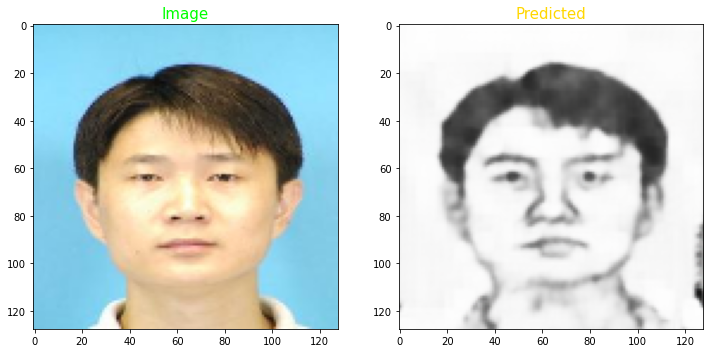

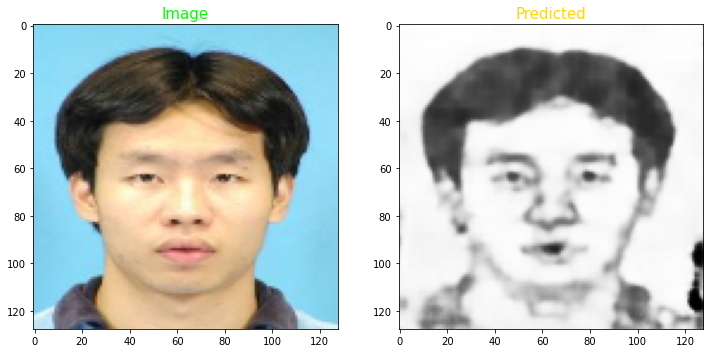

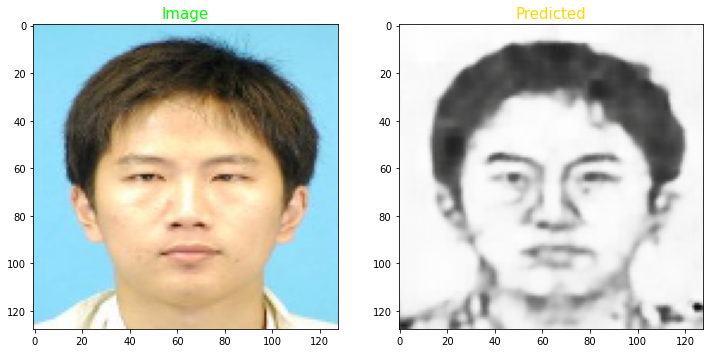

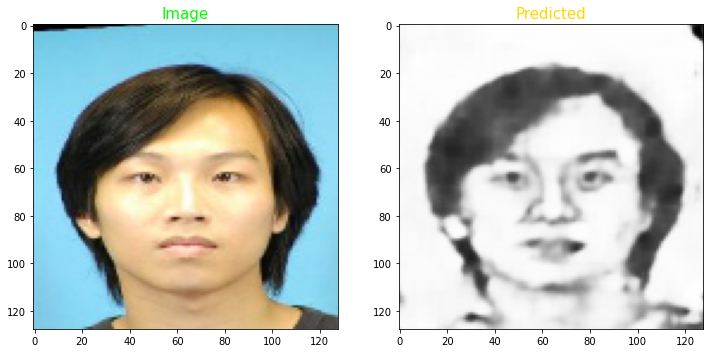

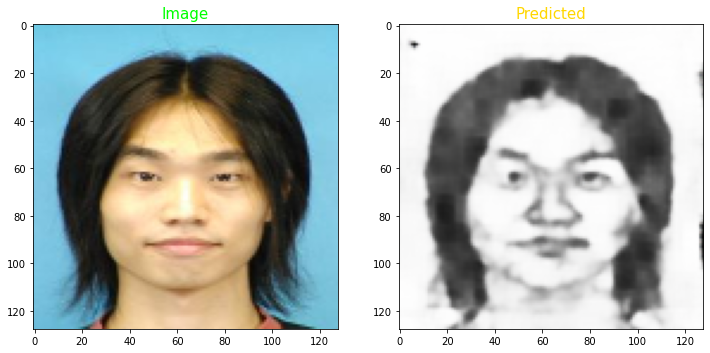

...

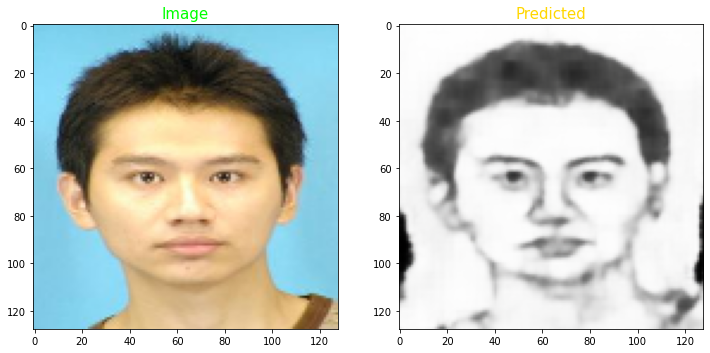

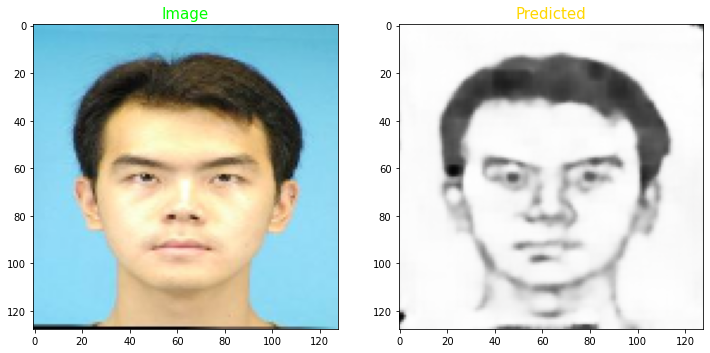

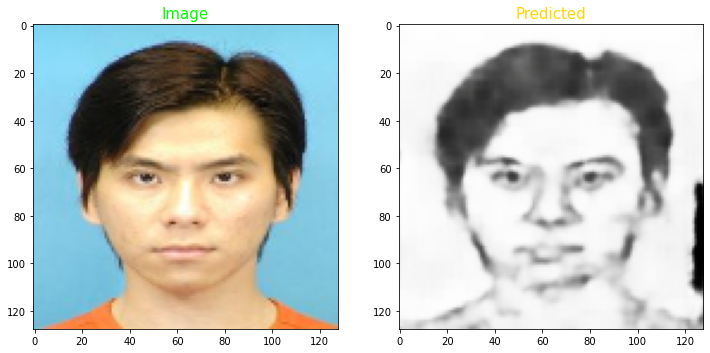

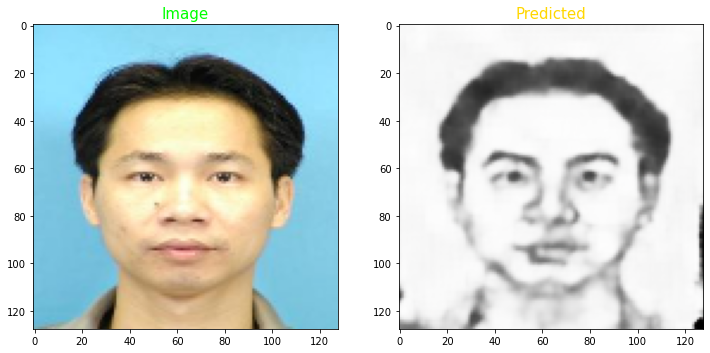

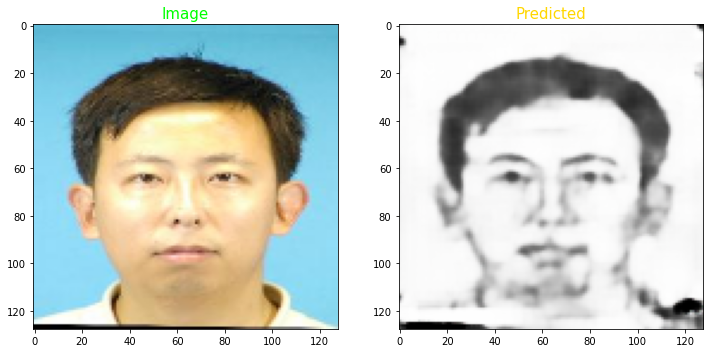

In [23]:
num = [i for i in range(0, 95, 8)]
for i in num:
    predicted = (np.clip(vae.predict(
        test_image[i].reshape(1, size, size, 3)), 0.0, 1.0)
                     .reshape(size, size, 3))
    show_images(test_image[i], predicted)

At 1000 epoch, the predicted output now looks like an oil drawing/painting rather than a sketch drawing.

### Results Discussion and Conclusion

**A. Results** <br>
Based on the results of the epochs, the model has successfully converted the images to sketch images and it became more detailed as the epoch increased. The test accuracy has also increased from 35.9% at 25 epoch to 57.9% at 1000 epoch. The VAE model has a standard loss function which is called the sum of the reconsturction loss and similarity loss. I didn't implement this custom loss in the model architecture because of the errors I get during fitting the model.

**B. Key Takeaways** <br>
* Increasing the train image dataset would improve the results
* Data Augementation helped in improving the results
* Higher the epoch, the better the results but computationally expensive
* But an even higher epoch would tend to change the output of the prediction (Epoch 1000 gave the drawing an oil painting touch), so just in the middle of a low and high epoch will give a better result.

**C. Business Value** <br>
The business value of this Image to Sketch Generator is in creating mobile applications in converting images to drawing. Also, portrait drawings is a good gift that we can give to our love ones. Oil Painting and drawings here in the Philippines cost around Php 2.7k to Php 65.5k depending on the canvas size, how many person would be drawn, and how talented, and skillful the artist is. With this Image to Sketch Generator, there is a suitable market in the low to mid class status.

**D. Other Applications of the Model** <br>
One application of this model architecture is converting Sketches to Images which is shown in the Appendix. The Sketch to Image has a very good business value for law enforcements. This would help them in the accuracy for looking suspects and criminals from sketch since their process in identifying suspects usually starts from sketching what the suspect or criminal looks like based on the features the witness is describing. Based on the results at 250 , we can see that the model has successfully converted the sketch to an image but the image is a bit blurry. So further fine tuning of the model architecture, data augmentation, and adding more training dataset would improve the output.

**E. Improving the Model** <br>
In order to improve the quality of the output of the model, we need to add more training dataset. The model can still be furthered improved through the use of better data augmentation techniques (like `ImageDataGenerator` in Tensorflow) in order to further increase the training dataset. I tried using ImageDataGenerator but got bad results in the image to sketch generator. This model can also be improved by using pre-trained Models and by fine tuning through freezing of layers since the image dataset is small and pretrained networks is a saved network that was previously training on a large dataset. So this will be able to help in improving the quality of the output.

### References

[1] Anwar, Aqeel. (2021, November 3). Difference between AutoEncoder (AE) and Variational AutoEncoder (VAE) <br>
https://towardsdatascience.com/difference-between-autoencoder-ae-and-variational-autoencoder-vae-ed7be1c038f2

[2] Rocca, Joseph. (2019, September 24). Understanding Variational Autoencoders (VAEs) <br>
https://towardsdatascience.com/understanding-variational-autoencoders-vaes-f70510919f73

[3] TensorFlow. (2022, April 26). Convolutional Variational AutoEncoder<br>
https://www.tensorflow.org/tutorials/generative/cvae

[4] dgdelahera1. (n.d.). Anomalies_tv notebook <br>
https://www.kaggle.com/dgdelahera1/anomalies-tv

[5] yehyachali. (n.d.). DrawMe notebook <br>
https://www.kaggle.com/yehyachali/drawme

[6] theblackmamba31. (n.d.). Photo to sketch using autoencoder notebook <br>
https://www.kaggle.com/theblackmamba31/photo-to-sketch-using-autoencoder/notebook

[7] Lisondra, John Magne. (2015, March 24). Commission Work and Order <br>
https://www.jmlisondra.com/sp/v/commission_work_and_order

## Appendix: Sketch to Image Generator

Using the same Variational AutoEncoder Model Architecture used in the Image to Sketch Generator for this Sketch to Image Generator implementation.

### @250 Epoch

In [60]:
history_250_flip = vae.fit(
            x=train_sketch_image,
            y=train_image,
            epochs=250,
            validation_data=(val_sketch_image, val_image),
            batch_size=25)

Epoch 1/250
42/42 [==============================] - 9s 75ms/step - loss: 0.2439 - acc: 0.1801 - val_loss: 0.2085 - val_acc: 0.1311
Epoch 2/250
42/42 [==============================] - 3s 63ms/step - loss: 0.2101 - acc: 0.1427 - val_loss: 0.1874 - val_acc: 0.1563
Epoch 3/250
42/42 [==============================] - 3s 73ms/step - loss: 0.1979 - acc: 0.2569 - val_loss: 0.1785 - val_acc: 0.3480
Epoch 4/250
42/42 [==============================] - 3s 70ms/step - loss: 0.1933 - acc: 0.3451 - val_loss: 0.1715 - val_acc: 0.4277
Epoch 5/250
42/42 [==============================] - 3s 62ms/step - loss: 0.1699 - acc: 0.4086 - val_loss: 0.1464 - val_acc: 0.3922
Epoch 6/250
42/42 [==============================] - 3s 64ms/step - loss: 0.1517 - acc: 0.3974 - val_loss: 0.1417 - val_acc: 0.4020
Epoch 7/250
42/42 [==============================] - 3s 63ms/step - loss: 0.1490 - acc: 0.4257 - val_loss: 0.1361 - val_acc: 0.4540
Epoch 8/250
42/42 [==============================] - 3s 65ms/step - loss: 0.

42/42 [==============================] - 3s 63ms/step - loss: 0.0919 - acc: 0.8905 - val_loss: 0.0847 - val_acc: 0.8895
Epoch 124/250
42/42 [==============================] - 3s 66ms/step - loss: 0.0907 - acc: 0.8919 - val_loss: 0.0786 - val_acc: 0.9138
Epoch 125/250
42/42 [==============================] - 3s 65ms/step - loss: 0.0890 - acc: 0.8967 - val_loss: 0.0805 - val_acc: 0.9145
Epoch 126/250
42/42 [==============================] - 3s 65ms/step - loss: 0.0893 - acc: 0.8968 - val_loss: 0.0798 - val_acc: 0.9110
Epoch 127/250
42/42 [==============================] - 3s 64ms/step - loss: 0.0899 - acc: 0.8968 - val_loss: 0.0792 - val_acc: 0.9111
Epoch 128/250
42/42 [==============================] - 3s 64ms/step - loss: 0.0886 - acc: 0.8978 - val_loss: 0.0813 - val_acc: 0.9147
Epoch 129/250
42/42 [==============================] - 3s 64ms/step - loss: 0.0890 - acc: 0.8973 - val_loss: 0.0822 - val_acc: 0.9123
Epoch 130/250
42/42 [==============================] - 3s 63ms/step - loss: 

42/42 [==============================] - 3s 63ms/step - loss: 0.0740 - acc: 0.9125 - val_loss: 0.0839 - val_acc: 0.9195
Epoch 246/250
42/42 [==============================] - 3s 64ms/step - loss: 0.0737 - acc: 0.9127 - val_loss: 0.0808 - val_acc: 0.9198
Epoch 247/250
42/42 [==============================] - 3s 63ms/step - loss: 0.0737 - acc: 0.9127 - val_loss: 0.0816 - val_acc: 0.9217
Epoch 248/250
42/42 [==============================] - 3s 64ms/step - loss: 0.0758 - acc: 0.9114 - val_loss: 0.0814 - val_acc: 0.9189
Epoch 249/250
42/42 [==============================] - 3s 63ms/step - loss: 0.0737 - acc: 0.9124 - val_loss: 0.0808 - val_acc: 0.9205
Epoch 250/250
42/42 [==============================] - 3s 64ms/step - loss: 0.0740 - acc: 0.9122 - val_loss: 0.0803 - val_acc: 0.9160


In [61]:
# Test Evaluation
prediction_250_flip = vae.evaluate(test_sketch_image, test_image)

4/4 [==============================] - 0s 26ms/step - loss: 0.0726 - acc: 0.9257


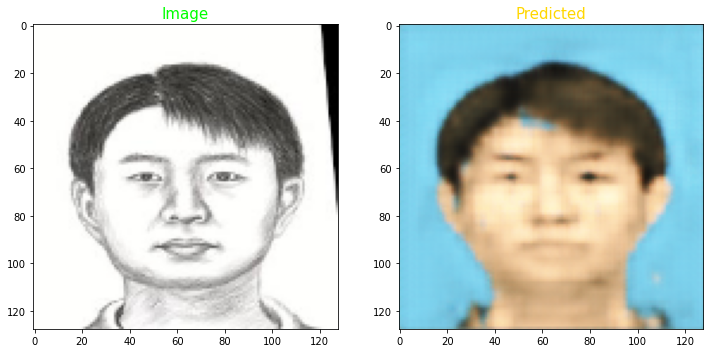

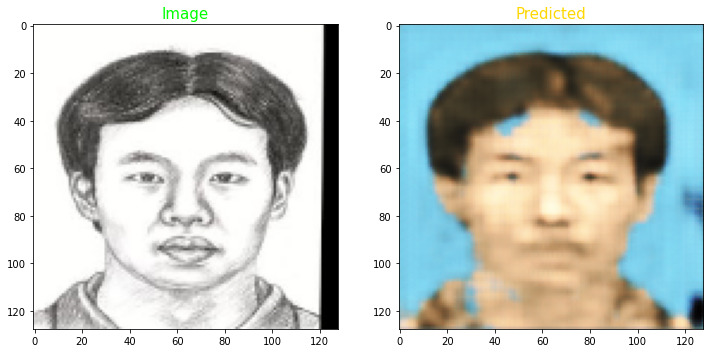

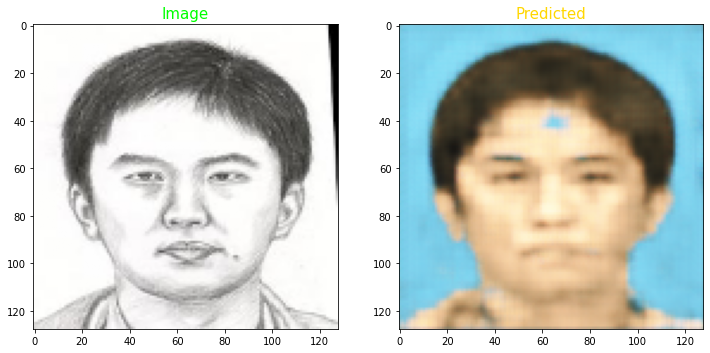

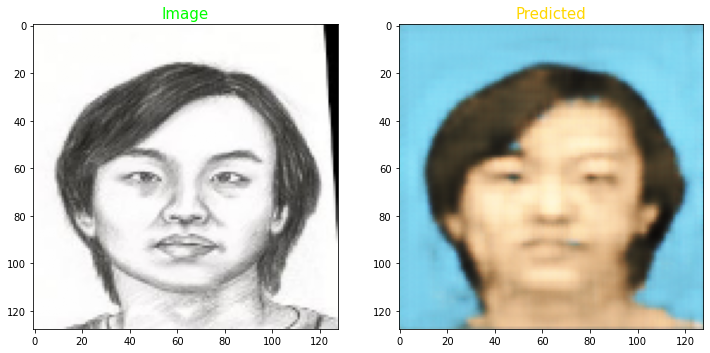

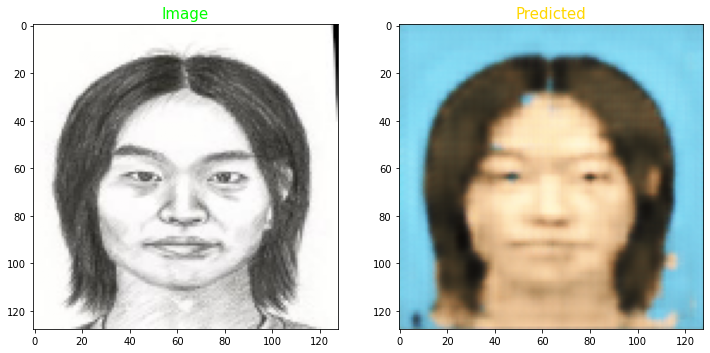

...

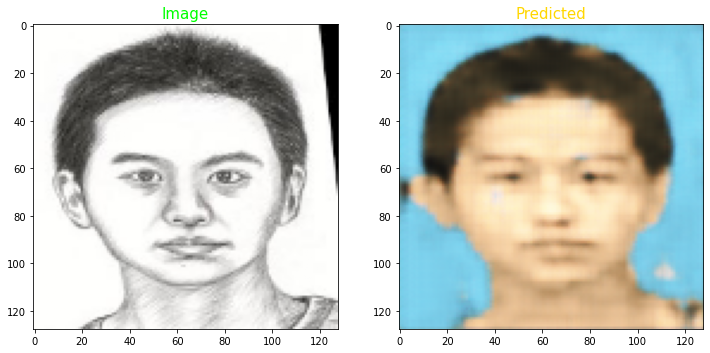

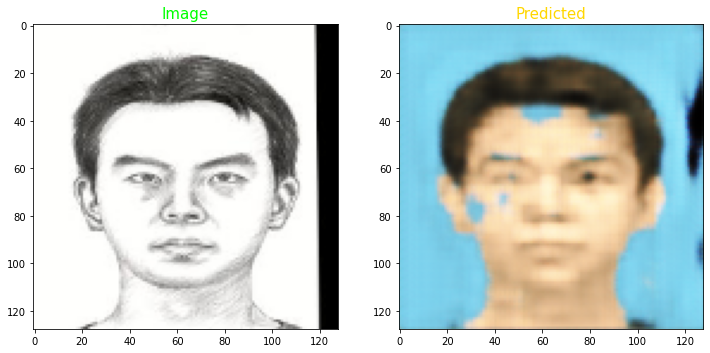

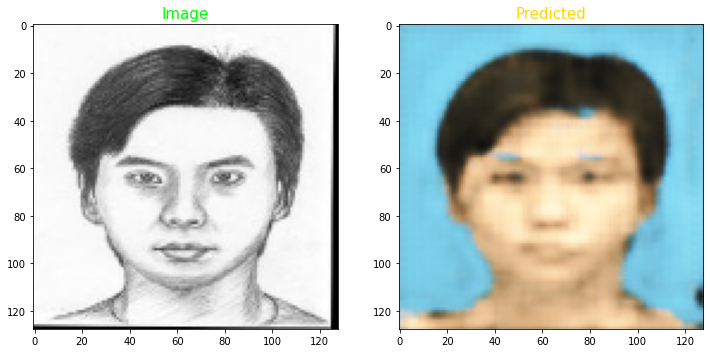

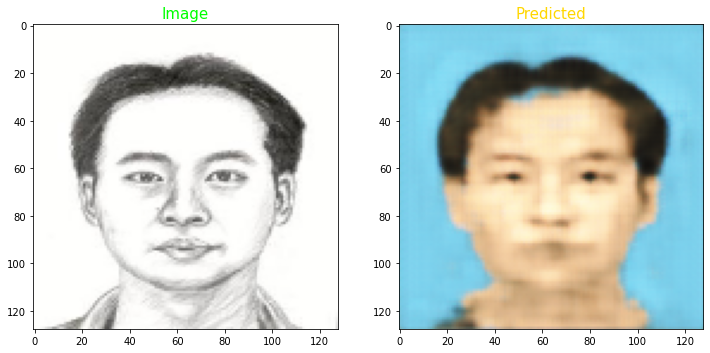

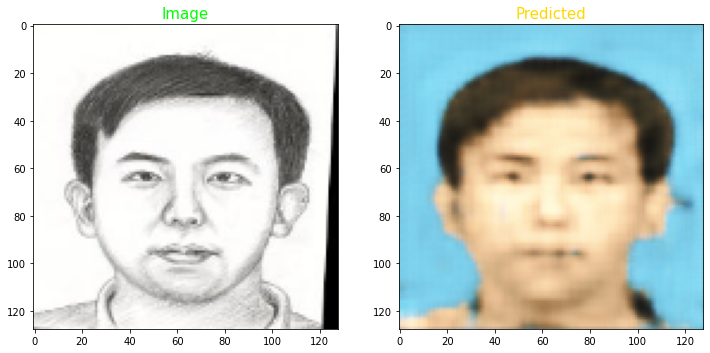

In [64]:
num = [i for i in range(0, 95, 8)]
for i in num:
    predicted = (np.clip(vae.predict(
        test_sketch_image[i].reshape(1, size, size, 3)), 0.0, 1.0)
                     .reshape(size, size, 3))
    show_images(test_sketch_image[i], predicted)